In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV,ElasticNetCV,LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import confusion_matrix, roc_curve,roc_auc_score
import matplotlib.pyplot as plt
from pandas_profiling import  ProfileReport
import seaborn as sns
import pickle

In [2]:
df1=pd.read_csv('E:\\AReM\\bending1\\dataset1.csv',skiprows=4)

In [3]:
df1

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,39.25,0.43,22.75,0.43,33.75,1.3
1,250,39.25,0.43,23.00,0.00,33.00,0.0
2,500,39.25,0.43,23.25,0.43,33.00,0.0
3,750,39.50,0.50,23.00,0.71,33.00,0.0
4,1000,39.50,0.50,24.00,0.00,33.00,0.0
...,...,...,...,...,...,...,...
475,118750,43.33,0.47,25.00,0.00,30.00,0.0
476,119000,43.50,0.50,25.50,0.50,30.00,0.0
477,119250,43.50,0.50,24.75,0.43,30.00,0.0
478,119500,43.50,0.50,24.33,0.47,30.00,0.0


In [4]:
df2=pd.read_csv('E:\\AReM\\bending1\\dataset2.csv',skiprows=4)

In [5]:
df3=pd.read_csv('E:\\AReM\\bending1\\dataset3.csv',skiprows=4)

In [6]:
df4=pd.read_csv('E:\\AReM\\bending1\\dataset4.csv',skiprows=4)

In [7]:
df5=pd.read_csv('E:\\AReM\\bending1\\dataset5.csv',skiprows=4)

In [8]:
df6=pd.read_csv('E:\\AReM\\bending1\\dataset6.csv',skiprows=4)

In [9]:
df7=pd.read_csv('E:\\AReM\\bending1\\dataset7.csv',skiprows=4)

In [10]:
bending1_merge=pd.concat([df1,df2,df3,df4,df5,df6,df7])

In [11]:
bending1_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,39.25,0.43,22.75,0.43,33.75,1.30
1,250,39.25,0.43,23.00,0.00,33.00,0.00
2,500,39.25,0.43,23.25,0.43,33.00,0.00
3,750,39.50,0.50,23.00,0.71,33.00,0.00
4,1000,39.50,0.50,24.00,0.00,33.00,0.00
...,...,...,...,...,...,...,...
475,118750,44.25,0.83,16.25,1.30,24.00,0.00
476,119000,44.00,0.71,11.00,1.00,24.00,0.00
477,119250,44.25,0.43,10.25,1.30,22.75,0.83
478,119500,43.75,0.43,7.33,2.87,21.50,0.50


In [12]:
bending1_merge.insert(7,column='Lables',value='Bending1')

In [13]:
bending1_merge.head()

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,39.25,0.43,22.75,0.43,33.75,1.3,Bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.0,Bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.0,Bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.0,Bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.0,Bending1


In [14]:
bending1_merge=bending1_merge.to_csv('data_1.csv')

In [15]:
df1=pd.read_csv('E:\\AReM\\bending2\\dataset1.csv',skiprows=4)

In [16]:
df1

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,23.75,0.43,24.00,0.00,24.67,0.47
1,250,22.67,0.94,24.00,0.00,24.67,0.94
2,500,21.33,0.47,24.00,0.00,24.75,0.83
3,750,21.00,0.00,24.00,0.00,25.25,1.09
4,1000,23.00,0.71,23.75,0.43,24.75,0.83
...,...,...,...,...,...,...,...
475,118750,27.50,0.50,22.75,1.30,21.00,0.00
476,119000,27.00,0.00,21.00,0.00,20.75,1.09
477,119250,27.00,0.00,21.00,0.00,20.50,0.50
478,119500,27.25,0.43,23.50,0.87,20.75,0.43


In [17]:
df2=pd.read_csv('E:\\AReM\\bending2\\dataset2.csv',skiprows=4)

In [18]:
df3=pd.read_csv('E:\\AReM\\bending2\\dataset3.csv',skiprows=4)

In [19]:
df4=pd.read_csv('E:\\AReM\\bending2\\dataset4.csv',skiprows=4)

In [20]:
df5=pd.read_csv('E:\\AReM\\bending2\\dataset5.csv',skiprows=4)

In [21]:
df6=pd.read_csv('E:\\AReM\\bending2\\dataset6.csv',skiprows=4)

In [22]:
bending2_merge=pd.concat([df1,df2,df3,df4,df5,df6])

In [23]:
bending2_merge.insert(7,column='Lables',value='Bending2')

In [24]:
bending2_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,23.75,0.43,24.00,0.00,24.67,0.47,Bending2
1,250,22.67,0.94,24.00,0.00,24.67,0.94,Bending2
2,500,21.33,0.47,24.00,0.00,24.75,0.83,Bending2
3,750,21.00,0.00,24.00,0.00,25.25,1.09,Bending2
4,1000,23.00,0.71,23.75,0.43,24.75,0.83,Bending2
...,...,...,...,...,...,...,...,...
475,118750,27.00,0.00,14.00,0.00,6.50,0.50,Bending2
476,119000,27.00,0.00,15.00,0.00,4.00,1.00,Bending2
477,119250,27.00,0.00,14.25,0.83,4.00,2.00,Bending2
478,119500,27.00,0.00,13.33,1.25,1.50,0.50,Bending2


In [25]:
bending2_merge=bending2_merge.to_csv('data_2.csv')

In [26]:
df1=pd.read_csv('E:\\AReM\\cycling\\dataset1.csv',skiprows=4)

In [27]:
df1

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,32.00,4.85,17.50,3.35,22.50,3.20
1,250,40.50,1.12,14.00,2.24,21.75,1.30
2,500,40.50,2.60,11.33,4.50,18.25,5.31
3,750,34.50,1.50,20.67,2.87,19.00,2.83
4,1000,34.50,1.50,21.25,3.27,18.25,4.38
...,...,...,...,...,...,...,...
475,118750,38.00,2.55,18.25,2.17,20.00,4.74
476,119000,36.00,0.00,19.00,1.41,13.67,1.25
477,119250,37.00,1.73,17.75,0.43,22.50,0.87
478,119500,37.00,3.74,19.00,4.18,22.00,1.41


In [28]:
df2=pd.read_csv('E:\\AReM\\cycling\\dataset2.csv',skiprows=4)

In [29]:
df3=pd.read_csv('E:\\AReM\\cycling\\dataset3.csv',skiprows=4)

In [30]:
df4=pd.read_csv('E:\\AReM\\cycling\\dataset4.csv',skiprows=4)

In [31]:
df5=pd.read_csv('E:\\AReM\\cycling\\dataset5.csv',skiprows=4)

In [32]:
df6=pd.read_csv('E:\\AReM\\cycling\\dataset6.csv',skiprows=4)

In [33]:
df7=pd.read_csv('E:\\AReM\\cycling\\dataset7.csv',skiprows=4)

In [34]:
df8=pd.read_csv('E:\\AReM\\cycling\\dataset8.csv',skiprows=4)

In [35]:
df9=pd.read_csv('E:\\AReM\\cycling\\dataset9.csv',skiprows=4,error_bad_lines=False)

b'Skipping line 485: expected 7 fields, saw 8\n'


In [36]:
df10=pd.read_csv('E:\\AReM\\cycling\\dataset10.csv',skiprows=4)

In [37]:
df11=pd.read_csv('E:\\AReM\\cycling\\dataset11.csv',skiprows=4)

In [38]:
df12=pd.read_csv('E:\\AReM\\cycling\\dataset12.csv',skiprows=4)

In [39]:
df13=pd.read_csv('E:\\AReM\\cycling\\dataset13.csv',skiprows=4)

In [40]:
df14=pd.read_csv('E:\\AReM\\cycling\\dataset14.csv',skiprows=4,error_bad_lines=False)

b'Skipping line 485: expected 7 fields, saw 8\n'


In [41]:
df15=pd.read_csv('E:\\AReM\\cycling\\dataset15.csv',skiprows=4)

In [42]:
cycling_merge=pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,df13,df14,df15])

In [43]:
cycling_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,32.00,4.85,17.50,3.35,22.50,3.20
1,250,40.50,1.12,14.00,2.24,21.75,1.30
2,500,40.50,2.60,11.33,4.50,18.25,5.31
3,750,34.50,1.50,20.67,2.87,19.00,2.83
4,1000,34.50,1.50,21.25,3.27,18.25,4.38
...,...,...,...,...,...,...,...
475,118750,38.00,2.55,18.25,2.17,20.00,4.74
476,119000,36.00,0.00,19.00,1.41,13.67,1.25
477,119250,37.00,1.73,17.75,0.43,22.50,0.87
478,119500,37.00,3.74,19.00,4.18,22.00,1.41


In [44]:
cycling_merge.insert(7,column='Lables',value='cycling')

In [45]:
cycling_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,32.00,4.85,17.50,3.35,22.50,3.20,cycling
1,250,40.50,1.12,14.00,2.24,21.75,1.30,cycling
2,500,40.50,2.60,11.33,4.50,18.25,5.31,cycling
3,750,34.50,1.50,20.67,2.87,19.00,2.83,cycling
4,1000,34.50,1.50,21.25,3.27,18.25,4.38,cycling
...,...,...,...,...,...,...,...,...
475,118750,38.00,2.55,18.25,2.17,20.00,4.74,cycling
476,119000,36.00,0.00,19.00,1.41,13.67,1.25,cycling
477,119250,37.00,1.73,17.75,0.43,22.50,0.87,cycling
478,119500,37.00,3.74,19.00,4.18,22.00,1.41,cycling


In [46]:
cycling_merge=cycling_merge.to_csv('data_3.csv')

In [47]:
df1=pd.read_csv('E:\\AReM\\lying\\dataset1.csv',skiprows=4)

In [48]:
df2=pd.read_csv('E:\\AReM\\lying\\dataset2.csv',skiprows=4)

In [49]:
df3=pd.read_csv('E:\\AReM\\lying\\dataset3.csv',skiprows=4)

In [50]:
df4=pd.read_csv('E:\\AReM\\lying\\dataset4.csv',skiprows=4)

In [51]:
df5=pd.read_csv('E:\\AReM\\lying\\dataset5.csv',skiprows=4)

In [52]:
df6=pd.read_csv('E:\\AReM\\lying\\dataset6.csv',skiprows=4)

In [53]:
df7=pd.read_csv('E:\\AReM\\lying\\dataset7.csv',skiprows=4)

In [54]:
df8=pd.read_csv('E:\\AReM\\lying\\dataset8.csv',skiprows=4)

In [55]:
df9=pd.read_csv('E:\\AReM\\lying\\dataset9.csv',skiprows=4)

In [56]:
df10=pd.read_csv('E:\\AReM\\lying\\dataset10.csv',skiprows=4)

In [57]:
df11=pd.read_csv('E:\\AReM\\lying\\dataset11.csv',skiprows=4)

In [58]:
df12=pd.read_csv('E:\\AReM\\lying\\dataset12.csv',skiprows=4)

In [59]:
df13=pd.read_csv('E:\\AReM\\lying\\dataset13.csv',skiprows=4)

In [60]:
df14=pd.read_csv('E:\\AReM\\lying\\dataset14.csv',skiprows=4)

In [61]:
df15=pd.read_csv('E:\\AReM\\lying\\dataset15.csv',skiprows=4)

In [62]:
lying_merge=pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,df13,df14,df15])

In [63]:
lying_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,29.00,0.00,9.00,0.71,8.50,0.50
1,250,29.00,0.00,8.00,0.71,8.50,0.50
2,500,29.00,0.00,8.00,0.71,8.00,1.00
3,750,28.50,0.50,8.25,0.43,8.75,0.43
4,1000,29.00,0.00,8.75,1.09,9.00,0.00
...,...,...,...,...,...,...,...
475,118750,29.25,0.43,4.00,0.00,10.50,0.50
476,119000,29.25,0.43,4.00,0.00,10.25,0.83
477,119250,29.50,0.50,2.33,0.94,9.67,0.94
478,119500,29.00,0.00,2.67,0.47,10.00,0.82


In [64]:
lying_merge.insert(7,column='Lables',value='lying')

In [65]:
lying_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,29.00,0.00,9.00,0.71,8.50,0.50,lying
1,250,29.00,0.00,8.00,0.71,8.50,0.50,lying
2,500,29.00,0.00,8.00,0.71,8.00,1.00,lying
3,750,28.50,0.50,8.25,0.43,8.75,0.43,lying
4,1000,29.00,0.00,8.75,1.09,9.00,0.00,lying
...,...,...,...,...,...,...,...,...
475,118750,29.25,0.43,4.00,0.00,10.50,0.50,lying
476,119000,29.25,0.43,4.00,0.00,10.25,0.83,lying
477,119250,29.50,0.50,2.33,0.94,9.67,0.94,lying
478,119500,29.00,0.00,2.67,0.47,10.00,0.82,lying


In [66]:
lying_merge=lying_merge.to_csv('data_4.csv')

In [67]:
df1=pd.read_csv('E:\\AReM\\sitting\\dataset1.csv',skiprows=4)

In [68]:
df2=pd.read_csv('E:\\AReM\\sitting\\dataset2.csv',skiprows=4)

In [69]:
df3=pd.read_csv('E:\\AReM\\sitting\\dataset3.csv',skiprows=4)

In [70]:
df4=pd.read_csv('E:\\AReM\\sitting\\dataset4.csv',skiprows=4)

In [71]:
df5=pd.read_csv('E:\\AReM\\sitting\\dataset6.csv',skiprows=4)

In [72]:
df7=pd.read_csv('E:\\AReM\\sitting\\dataset7.csv',skiprows=4)

In [73]:
df8=pd.read_csv('E:\\AReM\\sitting\\dataset8.csv',skiprows=4)

In [74]:
df9=pd.read_csv('E:\\AReM\\sitting\\dataset9.csv',skiprows=4)

In [75]:
df10=pd.read_csv('E:\\AReM\\sitting\\dataset10.csv',skiprows=4)

In [76]:
df11=pd.read_csv('E:\\AReM\\sitting\\dataset11.csv',skiprows=4)

In [77]:
df12=pd.read_csv('E:\\AReM\\sitting\\dataset12.csv',skiprows=4)

In [78]:
df13=pd.read_csv('E:\\AReM\\sitting\\dataset13.csv',skiprows=4)

In [79]:
df14=pd.read_csv('E:\\AReM\\sitting\\dataset14.csv',skiprows=4)

In [80]:
df15=pd.read_csv('E:\\AReM\\sitting\\dataset15.csv',skiprows=4)

In [81]:
sitting_merge=pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,df13,df14,df15])

In [82]:
sitting_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,42.00,0.00,19.20,0.98,15.50,2.06
1,250,42.00,0.00,19.33,0.94,11.00,0.82
2,500,42.00,0.00,17.50,0.50,12.50,0.50
3,750,42.00,0.00,17.00,1.41,13.33,0.94
4,1000,42.00,0.00,17.50,0.87,12.00,0.82
...,...,...,...,...,...,...,...
475,118750,41.00,0.82,17.25,1.30,11.00,0.82
476,119000,41.50,0.50,18.00,0.00,10.67,1.25
477,119250,41.33,0.47,18.67,0.47,11.00,1.41
478,119500,41.50,0.50,18.50,0.50,12.33,0.47


In [83]:
sitting_merge.insert(7,column='Lables',value='sitting')

In [84]:
sitting_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,42.00,0.00,19.20,0.98,15.50,2.06,sitting
1,250,42.00,0.00,19.33,0.94,11.00,0.82,sitting
2,500,42.00,0.00,17.50,0.50,12.50,0.50,sitting
3,750,42.00,0.00,17.00,1.41,13.33,0.94,sitting
4,1000,42.00,0.00,17.50,0.87,12.00,0.82,sitting
...,...,...,...,...,...,...,...,...
475,118750,41.00,0.82,17.25,1.30,11.00,0.82,sitting
476,119000,41.50,0.50,18.00,0.00,10.67,1.25,sitting
477,119250,41.33,0.47,18.67,0.47,11.00,1.41,sitting
478,119500,41.50,0.50,18.50,0.50,12.33,0.47,sitting


In [85]:
sitting_merge=sitting_merge.to_csv('data_5.csv')

In [86]:
df1=pd.read_csv('E:\\AReM\\standing\\dataset1.csv',skiprows=4)

In [87]:
df2=pd.read_csv('E:\\AReM\\standing\\dataset2.csv',skiprows=4)

In [88]:
df3=pd.read_csv('E:\\AReM\\standing\\dataset3.csv',skiprows=4)

In [89]:
df4=pd.read_csv('E:\\AReM\\standing\\dataset4.csv',skiprows=4)

In [90]:
df5=pd.read_csv('E:\\AReM\\standing\\dataset5.csv',skiprows=4)

In [91]:
df6=pd.read_csv('E:\\AReM\\standing\\dataset6.csv',skiprows=4)

In [92]:
df7=pd.read_csv('E:\\AReM\\standing\\dataset7.csv',skiprows=4)

In [93]:
df8=pd.read_csv('E:\\AReM\\standing\\dataset8.csv',skiprows=4)

In [94]:
df9=pd.read_csv('E:\\AReM\\standing\\dataset9.csv',skiprows=4)

In [95]:
df10=pd.read_csv('E:\\AReM\\standing\\dataset10.csv',skiprows=4)

In [96]:
df11=pd.read_csv('E:\\AReM\\standing\\dataset11.csv',skiprows=4)

In [97]:
df12=pd.read_csv('E:\\AReM\\standing\\dataset12.csv',skiprows=4)

In [98]:
df13=pd.read_csv('E:\\AReM\\standing\\dataset13.csv',skiprows=4)

In [99]:
df14=pd.read_csv('E:\\AReM\\standing\\dataset14.csv',skiprows=4)

In [100]:
df15=pd.read_csv('E:\\AReM\\standing\\dataset15.csv',skiprows=4)

In [101]:
standing_merge=pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,df13,df14,df15])

In [102]:
standing_merge.insert(7,column='Lables',value='standing')

In [103]:
standing_merge

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,46.50,0.50,11.50,0.50,20.33,0.94,standing
1,250,46.50,0.50,12.00,0.00,20.25,0.43,standing
2,500,46.50,0.50,12.00,0.00,20.50,0.50,standing
3,750,46.50,0.50,12.75,0.43,19.50,0.50,standing
4,1000,46.50,0.50,13.25,0.43,18.75,0.43,standing
...,...,...,...,...,...,...,...,...
475,118750,45.25,0.43,12.25,0.43,13.75,0.83,standing
476,119000,45.00,0.00,12.60,0.80,14.25,0.83,standing
477,119250,45.00,0.00,12.00,0.00,14.50,0.50,standing
478,119500,45.50,0.50,12.25,0.43,14.50,0.50,standing


In [104]:
standing_merge=standing_merge.to_csv('data_6.csv')

In [105]:
df1=pd.read_csv('E:\\AReM\\walking\\dataset1.csv',skiprows=4)

In [106]:
df2=pd.read_csv('E:\\AReM\\walking\\dataset2.csv',skiprows=4)

In [107]:
df3=pd.read_csv('E:\\AReM\\walking\\dataset3.csv',skiprows=4)

In [108]:
df4=pd.read_csv('E:\\AReM\\walking\\dataset4.csv',skiprows=4)

In [109]:
df5=pd.read_csv('E:\\AReM\\walking\\dataset5.csv',skiprows=4)

In [110]:
df6=pd.read_csv('E:\\AReM\\walking\\dataset6.csv',skiprows=4)

In [111]:
df7=pd.read_csv('E:\\AReM\\walking\\dataset7.csv',skiprows=4)

In [112]:
df8=pd.read_csv('E:\\AReM\\walking\\dataset8.csv',skiprows=4)

In [113]:
df9=pd.read_csv('E:\\AReM\\walking\\dataset9.csv',skiprows=4)

In [114]:
df10=pd.read_csv('E:\\AReM\\walking\\dataset10.csv',skiprows=4)

In [115]:
df11=pd.read_csv('E:\\AReM\\walking\\dataset11.csv',skiprows=4)

In [116]:
df12=pd.read_csv('E:\\AReM\\walking\\dataset12.csv',skiprows=4)

In [117]:
df13=pd.read_csv('E:\\AReM\\walking\\dataset13.csv',skiprows=4)

In [118]:
df14=pd.read_csv('E:\\AReM\\walking\\dataset14.csv',skiprows=4)

In [119]:
df15=pd.read_csv('E:\\AReM\\walking\\dataset15.csv',skiprows=4)

In [120]:
walking_merge=pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12,df13,df14,df15])

In [121]:
walking_merge.insert(7,column='Lables',value='walking')

In [122]:
walking_merge=walking_merge.to_csv('data_7.csv')

In [123]:
from glob import glob


    


In [124]:
ARem_new=sorted(glob('E:/AReM/data_*.csv'))

In [125]:
ARem_new

['E:/AReM\\data_1.csv',
 'E:/AReM\\data_2.csv',
 'E:/AReM\\data_3.csv',
 'E:/AReM\\data_4.csv',
 'E:/AReM\\data_5.csv',
 'E:/AReM\\data_6.csv',
 'E:/AReM\\data_7.csv']

In [126]:
ARem1=pd.concat((pd.read_csv(file).assign(filename=file) for file in ARem_new), ignore_index=True)

In [127]:
ARem1

,Unnamed: 0,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables,filename
0,0,0,39.25,0.43,22.75,0.43,33.75,1.30,Bending1,E:/AReM\data_1.csv
1,1,250,39.25,0.43,23.00,0.00,33.00,0.00,Bending1,E:/AReM\data_1.csv
2,2,500,39.25,0.43,23.25,0.43,33.00,0.00,Bending1,E:/AReM\data_1.csv
3,3,750,39.50,0.50,23.00,0.71,33.00,0.00,Bending1,E:/AReM\data_1.csv
4,4,1000,39.50,0.50,24.00,0.00,33.00,0.00,Bending1,E:/AReM\data_1.csv
...,...,...,...,...,...,...,...,...,...,...
42232,475,118750,34.50,6.18,9.00,3.56,12.67,4.19,walking,E:/AReM\data_7.csv
42233,476,119000,25.75,6.02,13.75,2.05,16.00,1.58,walking,E:/AReM\data_7.csv
42234,477,119250,31.50,3.35,10.25,5.12,16.25,2.95,walking,E:/AReM\data_7.csv
42235,478,119500,33.75,2.77,14.00,3.24,13.75,0.43,walking,E:/AReM\data_7.csv


In [128]:
ProfileReport(ARem1)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [129]:
ARem1=ARem1.drop(['Unnamed: 0','filename'],axis=1)

In [130]:
ARem1

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,39.25,0.43,22.75,0.43,33.75,1.30,Bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.00,Bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.00,Bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.00,Bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.00,Bending1
...,...,...,...,...,...,...,...,...
42232,118750,34.50,6.18,9.00,3.56,12.67,4.19,walking
42233,119000,25.75,6.02,13.75,2.05,16.00,1.58,walking
42234,119250,31.50,3.35,10.25,5.12,16.25,2.95,walking
42235,119500,33.75,2.77,14.00,3.24,13.75,0.43,walking


In [131]:
ARem1.to_csv('arem1.csv')

In [132]:
df=pd.read_csv('arem1.csv')

In [133]:
df

,Unnamed: 0,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,0,39.25,0.43,22.75,0.43,33.75,1.30,Bending1
1,1,250,39.25,0.43,23.00,0.00,33.00,0.00,Bending1
2,2,500,39.25,0.43,23.25,0.43,33.00,0.00,Bending1
3,3,750,39.50,0.50,23.00,0.71,33.00,0.00,Bending1
4,4,1000,39.50,0.50,24.00,0.00,33.00,0.00,Bending1
...,...,...,...,...,...,...,...,...,...
42232,42232,118750,34.50,6.18,9.00,3.56,12.67,4.19,walking
42233,42233,119000,25.75,6.02,13.75,2.05,16.00,1.58,walking
42234,42234,119250,31.50,3.35,10.25,5.12,16.25,2.95,walking
42235,42235,119500,33.75,2.77,14.00,3.24,13.75,0.43,walking


In [134]:
df=df.drop(['Unnamed: 0'],axis=1)

In [135]:
df

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,39.25,0.43,22.75,0.43,33.75,1.30,Bending1
1,250,39.25,0.43,23.00,0.00,33.00,0.00,Bending1
2,500,39.25,0.43,23.25,0.43,33.00,0.00,Bending1
3,750,39.50,0.50,23.00,0.71,33.00,0.00,Bending1
4,1000,39.50,0.50,24.00,0.00,33.00,0.00,Bending1
...,...,...,...,...,...,...,...,...
42232,118750,34.50,6.18,9.00,3.56,12.67,4.19,walking
42233,119000,25.75,6.02,13.75,2.05,16.00,1.58,walking
42234,119250,31.50,3.35,10.25,5.12,16.25,2.95,walking
42235,119500,33.75,2.77,14.00,3.24,13.75,0.43,walking


In [136]:
df['Lables'].value_counts()

standing    7200
walking     7200
lying       7200
sitting     7199
cycling     7198
Bending1    3360
Bending2    2880
Name: Lables, dtype: int64

In [137]:
Lables={"Lables":{'Bending1':1,'Bending2':2,'lying':3,'sitting':4,'standing':5,'cycling':6,'walking':7}}

In [138]:
df=df.replace(Lables)

In [139]:
df

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,39.25,0.43,22.75,0.43,33.75,1.30,1
1,250,39.25,0.43,23.00,0.00,33.00,0.00,1
2,500,39.25,0.43,23.25,0.43,33.00,0.00,1
3,750,39.50,0.50,23.00,0.71,33.00,0.00,1
4,1000,39.50,0.50,24.00,0.00,33.00,0.00,1
...,...,...,...,...,...,...,...,...
42232,118750,34.50,6.18,9.00,3.56,12.67,4.19,7
42233,119000,25.75,6.02,13.75,2.05,16.00,1.58,7
42234,119250,31.50,3.35,10.25,5.12,16.25,2.95,7
42235,119500,33.75,2.77,14.00,3.24,13.75,0.43,7


In [140]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [141]:
df.isnull().sum()

# Columns: time      0
avg_rss12          480
var_rss12          480
avg_rss13          480
var_rss13          480
avg_rss23          480
var_rss23          480
Lables               0
dtype: int64

In [142]:
df['avg_rss12']=df['avg_rss12'].fillna(df['avg_rss12'].mean())

In [143]:
df['var_rss12']=df['var_rss12'].fillna(df['var_rss12'].mean())

In [144]:
df['avg_rss13']=df['avg_rss13'].fillna(df['avg_rss13'].mean())

In [145]:
df['var_rss13']=df['var_rss13'].fillna(df['var_rss13'].mean())

In [146]:
df['avg_rss23']=df['avg_rss23'].fillna(df['avg_rss23'].mean())

In [147]:
df['var_rss23']=df['var_rss23'].fillna(df['var_rss23'].mean())

In [148]:
df.isnull().sum()

# Columns: time    0
avg_rss12          0
var_rss12          0
avg_rss13          0
var_rss13          0
avg_rss23          0
var_rss23          0
Lables             0
dtype: int64

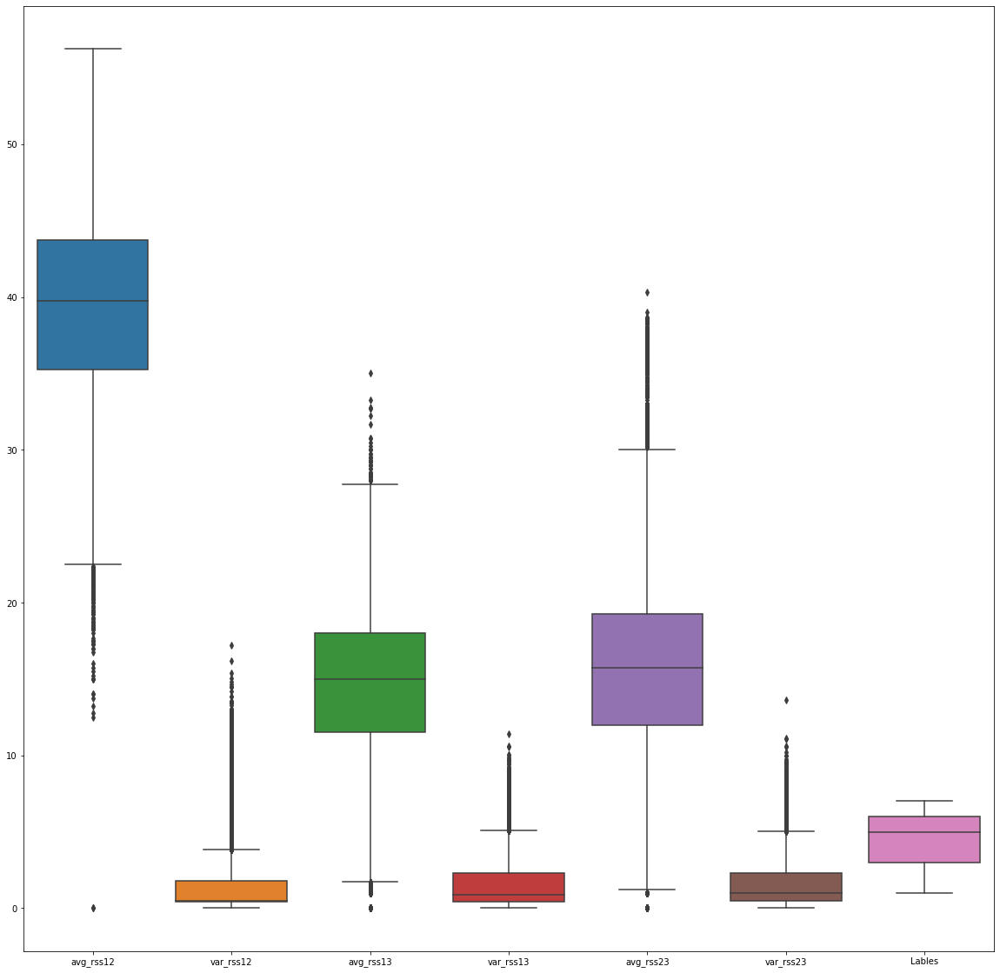

In [149]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df , ax = ax)

In [150]:
#There are lots of zero values in the columns var_rss23,avg_rss23,var_rss13,avg_rss13,var_rss12
#The feature columns are correlated below 0.75. So there is no multicolinearity between the features.


In [151]:
df['var_rss23']=df['var_rss23'].replace(0,df['var_rss23'].mean())

In [152]:
df['var_rss13']=df['var_rss13'].replace(0,df['var_rss13'].mean())

In [153]:
df['var_rss12']=df['var_rss12'].replace(0,df['var_rss12'].mean())

In [154]:
df['avg_rss23']=df['avg_rss23'].replace(0,df['avg_rss23'].mean())

In [155]:
df['avg_rss13']=df['avg_rss13'].replace(0,df['avg_rss13'].mean())

In [156]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [157]:
q = df['var_rss12'].quantile(.97)
df_new = df[df['var_rss12'] < q]

q = df['avg_rss12'].quantile(.98)
df_new = df[df['avg_rss12'] < q]

q = df['var_rss13'].quantile(.98)
df_new = df[df['var_rss13'] < q]

q = df['avg_rss13'].quantile(.99)
df_new = df[df['avg_rss13'] < q]

q = df['avg_rss23'].quantile(.97)
df_new = df[df['avg_rss23'] < q]

q = df['var_rss23'].quantile(.98)
df_new = df[df['var_rss23'] < q]

In [158]:
def outlier_removal(self,data):
        def outlier_limits(col):
            Q3, Q1 = np.nanpercentile(col, [75,25])
            IQR= Q3-Q1
            UL= Q3+1.5*IQR
            LL= Q1-1.5*IQR
            return UL, LL

        for column in data.columns:
            if data[column].dtype != 'int64':
                UL, LL= outlier_limits(data[column])
                data[column]= np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])

        return data


In [159]:
df_new

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,39.25,0.43,22.75,0.430000,33.75,1.300000,1
1,250,39.25,0.43,23.00,1.514183,33.00,1.628589,1
2,500,39.25,0.43,23.25,0.430000,33.00,1.628589,1
3,750,39.50,0.50,23.00,0.710000,33.00,1.628589,1
4,1000,39.50,0.50,24.00,1.514183,33.00,1.628589,1
...,...,...,...,...,...,...,...,...
42232,118750,34.50,6.18,9.00,3.560000,12.67,4.190000,7
42233,119000,25.75,6.02,13.75,2.050000,16.00,1.580000,7
42234,119250,31.50,3.35,10.25,5.120000,16.25,2.950000,7
42235,119500,33.75,2.77,14.00,3.240000,13.75,0.430000,7


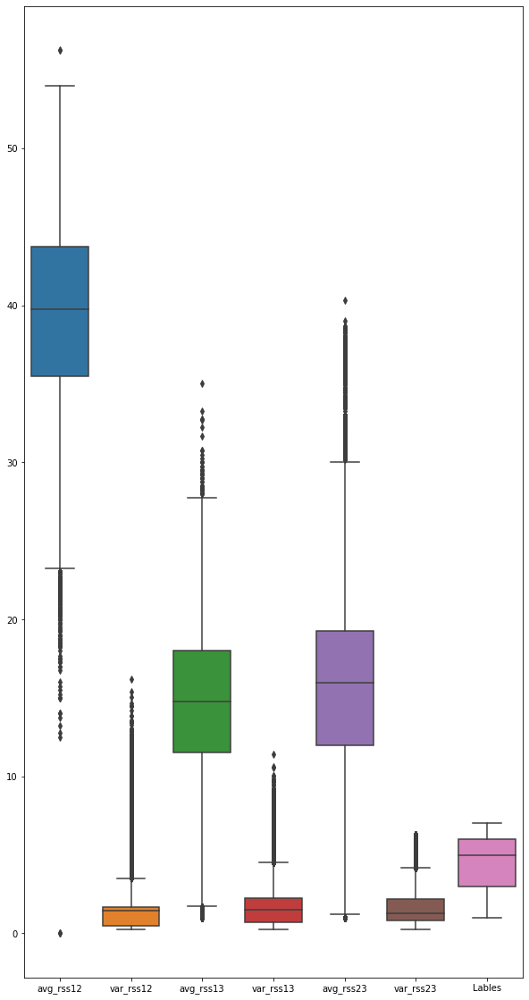

In [160]:
fig,ax=plt.subplots(figsize=(10,20))
sns.boxplot(data=df_new,ax=ax)

In [161]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [162]:
df_new.isnull().sum()


# Columns: time    0
avg_rss12          0
var_rss12          0
avg_rss13          0
var_rss13          0
avg_rss23          0
var_rss23          0
Lables             0
dtype: int64

In [163]:
df_new.describe()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
count,41377.000000,41377.000000,41377.000000,41377.000000,41377.000000,41377.000000,41377.000000
mean,39.130097,1.789377,14.332403,1.782108,16.083880,1.704879,4.436789
std,6.233554,1.845566,5.287835,1.446740,6.668891,1.313546,1.815114
min,0.000000,0.260000,1.000000,0.240000,1.000000,0.240000,1.000000
25%,35.500000,0.500000,11.500000,0.710000,12.000000,0.820000,3.000000
50%,39.750000,1.473821,14.750000,1.514183,15.949087,1.300000,5.000000
75%,43.750000,1.700000,18.000000,2.240000,19.250000,2.170000,6.000000
max,56.250000,16.200000,35.000000,11.420000,40.330000,6.290000,7.000000


In [164]:
df_new

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Lables
0,0,39.25,0.43,22.75,0.430000,33.75,1.300000,1
1,250,39.25,0.43,23.00,1.514183,33.00,1.628589,1
2,500,39.25,0.43,23.25,0.430000,33.00,1.628589,1
3,750,39.50,0.50,23.00,0.710000,33.00,1.628589,1
4,1000,39.50,0.50,24.00,1.514183,33.00,1.628589,1
...,...,...,...,...,...,...,...,...
42232,118750,34.50,6.18,9.00,3.560000,12.67,4.190000,7
42233,119000,25.75,6.02,13.75,2.050000,16.00,1.580000,7
42234,119250,31.50,3.35,10.25,5.120000,16.25,2.950000,7
42235,119500,33.75,2.77,14.00,3.240000,13.75,0.430000,7


In [165]:
df_new.dtypes

# Columns: time     object
avg_rss12          float64
var_rss12          float64
avg_rss13          float64
var_rss13          float64
avg_rss23          float64
var_rss23          float64
Lables               int64
dtype: object

In [166]:
df_new['# Columns: time'].describe()

count     41377
unique      960
top       54750
freq         87
Name: # Columns: time, dtype: object

In [167]:
df_new['# Columns: time']=pd.to_numeric(df_new['# Columns: time'],errors = 'coerce')

<ipython-input-167-04ec34be594f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['# Columns: time']=pd.to_numeric(df_new['# Columns: time'],errors = 'coerce')


In [168]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41377 entries, 0 to 42236
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   # Columns: time  40897 non-null  float64
 1   avg_rss12        41377 non-null  float64
 2   var_rss12        41377 non-null  float64
 3   avg_rss13        41377 non-null  float64
 4   var_rss13        41377 non-null  float64
 5   avg_rss23        41377 non-null  float64
 6   var_rss23        41377 non-null  float64
 7   Lables           41377 non-null  int64  
dtypes: float64(7), int64(1)
memory usage: 2.8 MB


In [169]:
df_new['# Columns: time'].isnull().sum()

480

In [170]:
df_new['# Columns: time']=df_new['# Columns: time'].fillna(df_new['# Columns: time'].mean())

<ipython-input-170-d28e24ed889a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['# Columns: time']=df_new['# Columns: time'].fillna(df_new['# Columns: time'].mean())


In [231]:
y=df_new['Lables']

In [232]:
y

0        1
1        1
2        1
3        1
4        1
        ..
42232    7
42233    7
42234    7
42235    7
42236    7
Name: Lables, Length: 41377, dtype: int64

In [233]:
x=df_new.drop(columns=['Lables'])

In [234]:
x

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0.0,39.25,0.43,22.75,0.430000,33.75,1.300000
1,250.0,39.25,0.43,23.00,1.514183,33.00,1.628589
2,500.0,39.25,0.43,23.25,0.430000,33.00,1.628589
3,750.0,39.50,0.50,23.00,0.710000,33.00,1.628589
4,1000.0,39.50,0.50,24.00,1.514183,33.00,1.628589
...,...,...,...,...,...,...,...
42232,118750.0,34.50,6.18,9.00,3.560000,12.67,4.190000
42233,119000.0,25.75,6.02,13.75,2.050000,16.00,1.580000
42234,119250.0,31.50,3.35,10.25,5.120000,16.25,2.950000
42235,119500.0,33.75,2.77,14.00,3.240000,13.75,0.430000


In [235]:
scalar = StandardScaler()

In [236]:

ProfileReport(pd.DataFrame(scalar.fit_transform(x)))
x_scaled = scalar.fit_transform(x)

In [237]:
x_scaled

array([[-1.73873435,  0.01923526, -0.73657237, ..., -0.9346006 ,
         2.64906616, -0.30823692],
       [-1.73147361,  0.01923526, -0.73657237, ..., -0.18519417,
         2.53660232, -0.0580796 ],
       [-1.72421286,  0.01923526, -0.73657237, ..., -0.9346006 ,
         2.53660232, -0.0580796 ],
       ...,
       [ 1.7246402 , -1.22405119,  0.84561693, ...,  2.30720947,
         0.02490992,  0.94791989],
       [ 1.73190094, -0.86309706,  0.53134645, ...,  1.00772057,
        -0.34996954, -0.97057415],
       [ 1.73916168, -0.34171887, -0.20556363, ...,  1.32568062,
        -0.76233695,  1.9909107 ]])

In [238]:
y

0        1
1        1
2        1
3        1
4        1
        ..
42232    7
42233    7
42234    7
42235    7
42236    7
Name: Lables, Length: 41377, dtype: int64

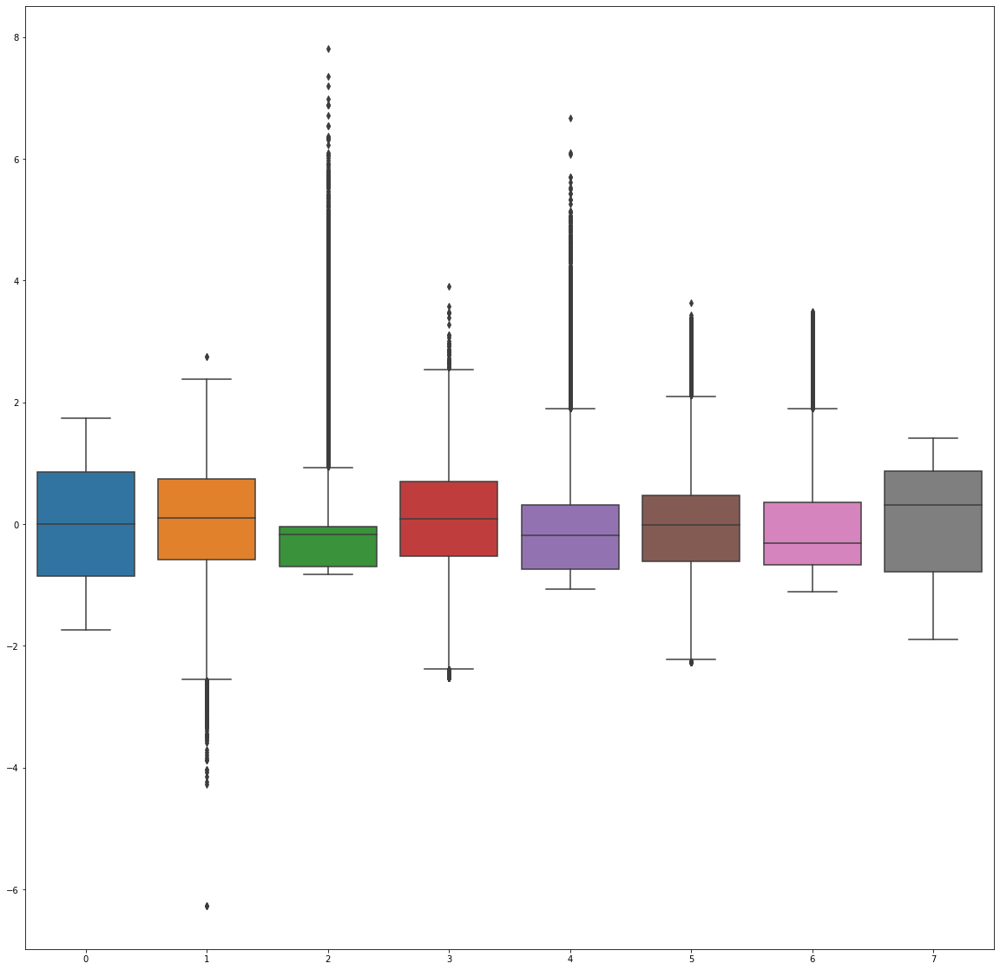

In [239]:
df_new_scalar = pd.DataFrame(scalar.fit_transform(df_new))
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = df_new_scalar , ax = ax)

In [240]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])


In [241]:
vif_score(x)

,FEATURE,VIF_SCORE
0,# Columns: time,1.000398
1,avg_rss12,1.189304
2,var_rss12,1.533326
3,avg_rss13,1.328420
4,var_rss13,1.456068
5,avg_rss23,1.288754
6,var_rss23,1.536882


In [242]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled , y , test_size = .30 , random_state = 144)

In [243]:
x_train

array([[-0.56975468, -1.42458127,  0.92147532, ...,  0.68284835,
         0.17486171,  0.43784409],
       [ 1.12925925,  0.72830961, -0.71489855, ..., -0.33324138,
         0.7371809 , -0.0580796 ],
       [ 1.44873195, -0.74277902,  0.43923269, ...,  1.0837545 ,
         0.43727733,  1.79297084],
       ...,
       [-0.71496955, -1.5047933 ,  1.522924  , ...,  1.32568062,
        -0.16252981,  0.56726631],
       [-0.96183482,  0.94167361, -0.17098242, ...,  0.7519701 ,
        -0.38745749, -0.15597549],
       [ 1.63751128,  0.34008338, -0.51983411, ..., -0.7410597 ,
        -0.61238516, -0.0580796 ]])

In [244]:
x_test

array([[ 0.44674938,  0.74114353, -0.73657237, ..., -0.45766053,
        -0.76233695, -0.53662907],
       [-1.26678604,  0.94167361, -0.17098242, ..., -0.05675438,
        -0.2120139 , -0.34630228],
       [-1.12883191, -0.74277902,  2.75291363, ...,  0.48930745,
         0.2498376 ,  0.43784409],
       ...,
       [-1.22322158, -2.18659555, -0.69864318, ..., -0.18519417,
         0.36230144, -0.91728265],
       [-1.01266002,  0.08661337, -0.29225894, ...,  0.7519701 ,
         0.28732555, -0.0580796 ],
       [ 0.38866343,  0.94167361, -0.17098242, ..., -0.05675438,
         0.21234965, -0.635599  ]])

In [245]:
x_test[0]

array([ 0.44674938,  0.74114353, -0.73657237,  0.59904214, -0.45766053,
       -0.76233695, -0.53662907])

In [246]:
logr_liblinear = LogisticRegression(verbose=1,solver='liblinear')

In [247]:
logr_liblinear.fit(x_train,y_train)

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

In [248]:
logr=LogisticRegression(verbose=1)

In [249]:
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s finished


LogisticRegression(verbose=1)

In [250]:
logr.predict_proba([x_test[1]])

array([[0.00338202, 0.01471455, 0.0230474 , 0.35798314, 0.49788852,
        0.08429623, 0.01868814]])

In [191]:
logr.predict([x_test[1]])

array([5], dtype=int64)

In [192]:
logr.predict_log_proba([x_test[1]])

array([[-5.68928315, -4.21891818, -3.77020239, -1.02726939, -0.69737908,
        -2.47341811, -3.97986619]])

In [193]:
type(y_test)

pandas.core.series.Series

In [194]:
y_test.iloc[1]

4

In [195]:
y_test

32458    5
21183    4
40881    7
34614    5
10217    6
        ..
8527     6
39550    7
5351     2
11619    6
21891    4
Name: Lables, Length: 12414, dtype: int64

In [196]:
logr

LogisticRegression(verbose=1)

In [197]:
logr_liblinear

LogisticRegression(solver='liblinear', verbose=1)

In [198]:
y_pred_liblinear = logr_liblinear.predict(x_test)
y_pred_liblinear

array([5, 5, 7, ..., 3, 6, 4], dtype=int64)

In [199]:
y_pred_default = logr.predict(x_test)

In [200]:
y_pred_default

array([5, 5, 7, ..., 3, 6, 4], dtype=int64)

In [201]:
from sklearn.metrics import confusion_matrix

In [252]:
confusion_matrix(y_test,y_pred_liblinear)

array([[ 857,    2,    2,   78,   57,    7,    0],
       [  62,  489,   72,  167,    8,   28,    7],
       [   0,   65, 1855,   87,  184,    3,    4],
       [  91,   99,  493,  515,  878,   81,    2],
       [  15,    1,  280,  398, 1415,   52,    5],
       [   9,   74,   11,  111,   34, 1092,  676],
       [   0,   38,    6,   16,    6,  551, 1431]], dtype=int64)

In [203]:
confusion_matrix(y_test,y_pred_default)

array([[ 827,    8,    0,  145,    7,   16,    0],
       [  57,  482,   59,  182,    2,   35,   16],
       [   0,   66, 1799,  134,  184,    4,   11],
       [  82,  109,  406,  940,  542,   71,    9],
       [   7,    3,  240,  577, 1297,   35,    7],
       [   8,   75,    5,  137,   15, 1234,  533],
       [   0,   32,    3,   22,    3,  649, 1339]], dtype=int64)

In [204]:
from sklearn.metrics import accuracy_score,roc_auc_score, classification_report
accuracy_score(y_test, y_pred_default)

0.6378282584179152

In [205]:
accuracy_score(y_test, y_pred_liblinear)

0.6165619461897858

In [206]:
logr_saga=LogisticRegression(verbose=1,solver='saga')

In [207]:
logr_saga

LogisticRegression(solver='saga', verbose=1)

In [208]:
logr_saga.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 14 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished


LogisticRegression(solver='saga', verbose=1)

In [209]:
y_pred_saga = logr_saga.predict(x_test)
y_pred_saga

array([5, 5, 7, ..., 3, 6, 4], dtype=int64)

In [210]:
confusion_matrix(y_test,y_pred_saga)

array([[ 827,    8,    0,  145,    7,   16,    0],
       [  57,  482,   59,  182,    2,   35,   16],
       [   0,   66, 1799,  134,  184,    4,   11],
       [  82,  109,  406,  939,  543,   71,    9],
       [   7,    3,  240,  577, 1297,   35,    7],
       [   8,   75,    5,  137,   15, 1235,  532],
       [   0,   32,    3,   22,    3,  650, 1338]], dtype=int64)

In [211]:
accuracy_score(y_test,y_pred_saga)

0.6377477042049299

In [253]:
logr_newton=LogisticRegression(verbose=1,solver='newton-cg')

In [254]:
logr_newton

LogisticRegression(solver='newton-cg', verbose=1)

In [255]:
logr_newton.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.1s finished


LogisticRegression(solver='newton-cg', verbose=1)

In [256]:
y_pred_newton = logr_newton.predict(x_test)
y_pred_newton

array([5, 5, 7, ..., 3, 6, 4], dtype=int64)

In [257]:
accuracy_score(y_test,y_pred_newton)

0.6377477042049299

In [266]:
logr_lbfgs=LogisticRegression(verbose=1, solver='lbfgs')

In [267]:
logr_lbfgs

LogisticRegression(verbose=1)

In [268]:
logr_lbfgs.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s finished


LogisticRegression(verbose=1)

In [269]:
y_pred_lbfgs=logr_lbfgs.predict(x_test)

In [270]:
y_pred_lbfgs

array([5, 5, 7, ..., 3, 6, 4], dtype=int64)

In [271]:
accuracy_score(y_test,y_pred_lbfgs)

0.6378282584179152

In [287]:
from sklearn import metrics
print(metrics.classification_report(y_test, y_pred_default))

              precision    recall  f1-score   support

           1       0.84      0.82      0.83      1003
           2       0.62      0.58      0.60       833
           3       0.72      0.82      0.76      2198
           4       0.44      0.44      0.44      2159
           5       0.63      0.60      0.62      2166
           6       0.60      0.61      0.61      2007
           7       0.70      0.65      0.68      2048

    accuracy                           0.64     12414
   macro avg       0.65      0.65      0.65     12414
weighted avg       0.64      0.64      0.64     12414



In [288]:
print(metrics.classification_report(y_test, y_pred_saga))

              precision    recall  f1-score   support

           1       0.84      0.82      0.83      1003
           2       0.62      0.58      0.60       833
           3       0.72      0.82      0.76      2198
           4       0.44      0.43      0.44      2159
           5       0.63      0.60      0.62      2166
           6       0.60      0.62      0.61      2007
           7       0.70      0.65      0.68      2048

    accuracy                           0.64     12414
   macro avg       0.65      0.65      0.65     12414
weighted avg       0.64      0.64      0.64     12414



In [289]:
print(metrics.classification_report(y_test, y_pred_newton))

              precision    recall  f1-score   support

           1       0.84      0.82      0.83      1003
           2       0.62      0.58      0.60       833
           3       0.72      0.82      0.76      2198
           4       0.44      0.43      0.44      2159
           5       0.63      0.60      0.62      2166
           6       0.60      0.61      0.61      2007
           7       0.70      0.65      0.68      2048

    accuracy                           0.64     12414
   macro avg       0.65      0.65      0.65     12414
weighted avg       0.64      0.64      0.64     12414



In [290]:
print(metrics.classification_report(y_test, y_pred_lbfgs))

              precision    recall  f1-score   support

           1       0.84      0.82      0.83      1003
           2       0.62      0.58      0.60       833
           3       0.72      0.82      0.76      2198
           4       0.44      0.44      0.44      2159
           5       0.63      0.60      0.62      2166
           6       0.60      0.61      0.61      2007
           7       0.70      0.65      0.68      2048

    accuracy                           0.64     12414
   macro avg       0.65      0.65      0.65     12414
weighted avg       0.64      0.64      0.64     12414



In [291]:
print(metrics.classification_report(y_test, y_pred_liblinear))

              precision    recall  f1-score   support

           1       0.83      0.85      0.84      1003
           2       0.64      0.59      0.61       833
           3       0.68      0.84      0.75      2198
           4       0.38      0.24      0.29      2159
           5       0.55      0.65      0.60      2166
           6       0.60      0.54      0.57      2007
           7       0.67      0.70      0.69      2048

    accuracy                           0.62     12414
   macro avg       0.62      0.63      0.62     12414
weighted avg       0.60      0.62      0.60     12414

